## **Part 2:**

- Impute missing values
- Keep valid range

In [47]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes, load_iris
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import levene, ttest_ind, f_oneway, kruskal, shapiro, kstest
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [18]:
import pandas as pd

# Read the data
df = pd.read_csv('/content/filtered_data.csv')
df_schema = pd.read_csv('/content/schema.csv')
df.shape

(18883, 70)

### **Data Modification**

Most frequently occuring value and the count

In [19]:
# most frequently occuring value and the count
most_frequent_values = {}
for column in df.columns:
    most_common = df[column].value_counts().idxmax()
    count = df[column].value_counts().max()
    most_frequent_values[column] = {'value': most_common, 'count': count}

# DataFrame from the dictionary
result_df = pd.DataFrame(most_frequent_values).T

print(result_df)

                                           value   count
Hospital Mortality                             0   15866
Age                                           77     504
Gender                                         M   11457
Uncomplicated Hypertension                     0   10123
Complicated Hypertension                       0   17418
Uncomplicated Diabetes                         0   14980
Complicated Diabetes                           0   17924
Malignancy                                     0   16871
Hematologic Disease                            0   16070
Metastasis                                     0   18055
Peripheral Vascular Disease                    0   17244
Hypothyroidism                                 0   17307
Chronic Heart Failure                          0   14348
Stroke                                         0   17825
Liver Disease                                  0   17085
SAPS II                                       34     692
SOFA                           

#### **Find Missing values**

Number of Missing values by Columns

In [20]:
# missing values column-wise
na_count = df.isnull().sum() # total count
na_pct = (na_count/len(df))*100 # percentage

na_df = pd.DataFrame({'Count': na_count.values,
                      'Percentage (%)': na_pct}).reset_index().rename(columns = {'index': 'Feature'})

na_df.sort_values(by='Percentage (%)', ascending=False)

,Feature,Count,Percentage (%)
49,Mean Lactate,5101,27.013716
48,Min Lactate,5101,27.013716
47,Max Lactate,5101,27.013716
50,Max pH,1173,6.211937
51,Min pH,1173,6.211937
52,Mean pH,1173,6.211937
44,Max Temperature,687,3.638193
45,Min Temperature,687,3.638193
46,Mean Temperature,687,3.638193
68,Ventilation Duration (h),497,2.631997


Number of missing values by rows

In [21]:
temp_df = df.copy()
# Calculate missing values by row
missing_values_by_row = df.isnull().sum(axis=1)

# Add the missing values count to the original DataFrame
temp_df["MissingValuesCount"] = missing_values_by_row

total_rows = len(temp_df)
temp_df["MissingValuesPercentage"] = (temp_df["MissingValuesCount"] / total_rows) * 100

# Sort the DataFrame by the "MissingValuesCount" column in descending order
df_sorted = temp_df.sort_values(by="MissingValuesPercentage", ascending=False)

# Print the sorted DataFrame
print(df_sorted[['MissingValuesCount','MissingValuesPercentage']].head(100))

       MissingValuesCount  MissingValuesPercentage
6766                   36                 0.190648
11565                  36                 0.190648
960                    36                 0.190648
6480                   36                 0.190648
8888                   27                 0.142986
8750                   25                 0.132394
1794                   24                 0.127098
4749                   24                 0.127098
4900                   24                 0.127098
13876                  24                 0.127098
13534                  24                 0.127098
10804                  24                 0.127098
4171                   24                 0.127098
1682                   22                 0.116507
4219                   22                 0.116507
1509                   22                 0.116507
8097                   22                 0.116507
11525                  22                 0.116507
15573                  22      

#### **Remove Missing Values**
- In the codes below, we are checking the missing values per group of variables.
- We have the rows counts towards the right with number of missing values towardsleft(1-5) and their respective percentages.

In [22]:
before_clear_mv = df.shape
print(f'Before clean missing values, the dataset has {before_clear_mv[0]} rows and {before_clear_mv[1]} variables')

Before clean missing values, the dataset has 18883 rows and 70 variables


In [23]:
# drop the columns RRT and Ventilation Duration (h) in df
df_orig = df.copy()
df = df.drop(['RRT', 'Ventilation Duration (h)'], axis=1)

In [24]:
def calculate_missing_percentages(df):
    df_copy = df.copy()  # Create a copy of the DataFrame
    missing_percentages = df_copy.isna().sum(axis=1) / len(df.columns) * 100
    missing_percentages = missing_percentages.round(2)

    # Create a new column to store the percentage of missing values
    df_copy['missing_percentage'] = missing_percentages

    # Group the DataFrame by the 'missing_percentage' column and count the number of observations in each group
    counts = df_copy.groupby('missing_percentage').size().reset_index(name='count')

    # Sort the table by percentage from highest to lowest
    counts = counts.sort_values(by='missing_percentage', ascending=False)

    # Print the table
    print(counts)

In [25]:
dem_f = df_schema[df_schema['category'] == 'Demographic'].index
medical_f = df_schema[df_schema['category'] == 'Medical history'].index
severe_f = df_schema[df_schema['category'] == 'Disease severity'].index
diag_f = df_schema[df_schema['category'] == 'Diagnosis'].index
vital_f = df_schema[df_schema['category'] == 'Vital signs'].index
lab_f = df_schema[df_schema['category'] == 'Laboratory results'].index

dem_df = df.iloc[:, dem_f]
medical_df = df.iloc[:,medical_f]
severe_df =df.iloc[:,severe_f]
diag_df = df.iloc[:,diag_f]
vital_df = df.iloc[:,vital_f]
lab_df = df.iloc[:,lab_f]


In [26]:
print('Demographic')
print(calculate_missing_percentages(dem_df))
print('-----------------------------')
print()
print('Medical history')
print(calculate_missing_percentages(medical_df))
print('-----------------------------')
print()
print('Disease severity')
print(calculate_missing_percentages(severe_df))
print('-----------------------------')
print()
print('Diagnosis')
print(calculate_missing_percentages(diag_df))
print('-----------------------------')
print()
print('Vital signs')
print(calculate_missing_percentages(vital_df))
print('-----------------------------')
print()
print('Laboratory results')
print(calculate_missing_percentages(lab_df))

Demographic
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Medical history
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Disease severity
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Diagnosis
   missing_percentage  count
0                 0.0  18883
None
-----------------------------

Vital signs
   missing_percentage  count
4               100.0     41
3                60.0      1
2                40.0     18
1                20.0    647
0                 0.0  18176
None
-----------------------------

Laboratory results
   missing_percentage  count
7              100.00     50
6               85.71      9
5               71.43      6
4               57.14     15
3               42.86     28
2               28.57    968
1               14.29   4345
0                0.00  13462
None


- Based on the above analysis, we removed all the rows that had missing values for vital signs and Laboratory features.

In [27]:
# removing missing values from Vital features
df.dropna(subset=['Max Heart Rate', 'Min Heart Rate', 'Mean Heart Rate',
                  'Max MAP', 'Min MAP', 'Mean MAP',
                  'Max Systolic Pressure', 'Min Systolic Pressure', 'Mean Systolic Pressure',
                  'Max Diastolic Pressure', 'Min Diastolic Pressure', 'Mean Diastolic Pressure',
                  'Max Temperature', 'Min Temperature', 'Mean Temperature'],
          inplace=True)

In [28]:
df.shape

(18176, 68)

In [29]:
# removing missing values from laboratory features
df.dropna(subset=['Max Lactate', 'Min Lactate', 'Mean Lactate',
                    'Max pH', 'Min pH', 'Mean pH',
                    'Max Glucose', 'Min Glucose', 'Mean Glucose',
                    'Max WBC', 'Min WBC', 'Mean WBC',
                    'Max BUN', 'Min BUN', 'Mean BUN',
                    'Max Creatinine', 'Min Creatinine', 'Mean Creatinine',
                    'Max Hemoglobin', 'Min Hemoglobin', 'Mean Hemoglobin'],
          inplace=True)

In [30]:
after_clean_missing_values = df.shape

#### After Clear up missing values

In [31]:
print(f'Before clean missing values, the dataset has {before_clear_mv[0]} rows and {before_clear_mv[1]} variables')
print(f'After clean missing values, the dataset has {after_clean_missing_values[0]} rows and {after_clean_missing_values[1]} variables')

Before clean missing values, the dataset has 18883 rows and 70 variables
After clean missing values, the dataset has 12799 rows and 68 variables


#### **Valid Range**

Make sure all variables are within valid range

In [32]:
df = df.loc[
    ((df['Max Heart Rate'] >= 0) & (df['Max Heart Rate'] <= 350))
    & ((df['Min Heart Rate'] >= 0) & (df['Max Heart Rate'] <= 350))
    & ((df['Mean Heart Rate'] >= 0) & (df['Mean Heart Rate'] <= 350))
    & ((df['Max MAP']  >= 14) & (df['Max MAP'] <= 330))
    & ((df['Min MAP']  >= 14) & (df['Min MAP'] <= 330))
    & ((df['Mean MAP']  >= 14) & (df['Mean MAP'] <= 330))
    & ((df['Min Systolic Pressure'] >= 0) & (df['Min Systolic Pressure'] <= 375))
    & ((df['Max Systolic Pressure'] >= 0) & (df['Max Systolic Pressure'] <= 375))
    & ((df['Mean Systolic Pressure'] >= 0) & (df['Mean Systolic Pressure'] <= 375))
    & ((df['Min Diastolic Pressure'] >= 0) & (df['Min Diastolic Pressure'] <= 375))
    & ((df['Max Diastolic Pressure'] >= 0) & (df['Max Diastolic Pressure'] <= 375))
    & ((df['Mean Diastolic Pressure'] >= 0) & (df['Mean Diastolic Pressure'] <= 375))
    & ((df['Min Temperature'] >= 26)& (df['Min Temperature'] <= 45))
    & ((df['Max Temperature'] >= 26)& (df['Max Temperature'] <= 45))
    & ((df['Mean Temperature'] >= 26)& (df['Mean Temperature'] <= 45))
    & ((df['Min pH']  >= 0)& (df['Min pH'] <= 14))
    & ((df['Max pH']  >= 0)& (df['Max pH'] <= 14))
    & ((df['Mean pH']  >= 0)& (df['Mean pH'] <= 14))
    & ((df['Min Lactate']  >= 0.4)& (df['Min Lactate'] <= 30))
    & ((df['Max Lactate']  >= 0.4)& (df['Max Lactate'] <= 30))
    & ((df['Mean Lactate']  >= 0.4)& (df['Mean Lactate'] <= 30))
    & ((df['Min Glucose'] >= 33)& (df['Min Glucose'] <= 2000))
    & ((df['Max Glucose'] >= 33)& (df['Max Glucose'] <= 2000))
    & ((df['Mean Glucose'] >= 33)& (df['Mean Glucose'] <= 2000))
    & ((df['Min WBC'] >= 0)& (df['Min WBC'] <= 1000))
    & ((df['Max WBC'] >= 0)& (df['Max WBC'] <= 1000))
    & ((df['Mean WBC'] >= 0)& (df['Mean WBC'] <= 1000))
    & ((df['Min BUN'] >= 0)& (df['Min BUN'] <= 250))
    & ((df['Max BUN'] >= 0)& (df['Max BUN'] <= 250))
    & ((df['Mean BUN'] >= 0)& (df['Mean BUN'] <= 250))
    & ((df['Min Creatinine'] >= 0.1)& (df['Min Creatinine'] <= 60))
    & ((df['Max Creatinine'] >= 0.1)& (df['Max Creatinine'] <= 60))
    & ((df['Mean Creatinine'] >= 0.1)& (df['Mean Creatinine'] <= 60))
    & ((df['Min Hemoglobin'] >= 0) & (df['Min Hemoglobin'] <= 25))
    & ((df['Max Hemoglobin'] >= 0) & (df['Max Hemoglobin'] <= 25))
    & ((df['Mean Hemoglobin'] >= 0) & (df['Mean Hemoglobin'] <= 25))
]

we removed around ~300 rows after appying valid ranges

In [33]:
print(df['Hospital Mortality'].value_counts())

0    10331
1     2158
Name: Hospital Mortality, dtype: int64


In [34]:
df.shape

(12489, 68)

### **Create Subsets**

In [35]:
binary = df_schema[((df_schema['variable_type']=='binary') | (df_schema.index == 'Hospital Mortality')) & (df_schema.index != 'RRT')].index
ordinal = df_schema[((df_schema['variable_type'] == 'ordinal') | (df_schema.index == 'Hospital Mortality'))].index
cont_all = df_schema[((df_schema['variable_type'] == 'continuous') | (df_schema.index == 'Hospital Mortality')) & (df_schema['category'] != 'Treatment')].index

print("Length of Binary Variables:",len(binary))
print("Length of Ordinal Variables:",len(ordinal))
print("Length of Continuous Variables:",len(cont_all))


Length of Binary Variables: 28
Length of Ordinal Variables: 3
Length of Continuous Variables: 37


In [36]:
cont_all_df = df.iloc[:, cont_all]
binary_df = df.iloc[:,binary]
ordinal_df = df.iloc[:,ordinal]

print("Shape Binary Variables:", binary_df.shape)
print("Shape Ordinal Variables:", ordinal_df.shape)
print("Shape Continuous Variables:", cont_all_df.shape)

Shape Binary Variables: (12489, 28)
Shape Ordinal Variables: (12489, 3)
Shape Continuous Variables: (12489, 37)


.**Quantitative variables can be further classified into:**

- ***Continuous variables:*** Also known as ratio variables. These are units of
measurement that can be represented in quantities less than 1. For instance, 0.8 km.

- ***Discrete or integer variables:*** Units that cannot be divided, such as 1 car or 1 tree.

- **Interval:**Variables that do not have a true zero (or it's arbitrary), or that zero value of that variable doesn't make sense. For example - IQ. Zero IQ doesn't mean anything. At the same time, person with IQ of 100 does not mean being twice as sharp to person with IQ of 50.
These variables have equal distance between values.

- **Ratio/Count:**Variables where zero value makes sense. For example - number of apples, 0 apples means nothing, while having 10 apples mean having twice as many as having 5 apples.
These variables have an intrinsic order with equal distance between values, howsoever small.

**Categorical variables are divided into the following variables:**

- ***Binary:*** Data that has one of two outcomes, such as yes/no or pass/fail.

- ***Nominal***: Used to describe data with no intrinsic order, such as brands, families, species.

- **Ordinal**: *italicized text* For ordered data types with observable scales of hierarchy, such as user ratings.

**Informal Rules:**

- Ordinal: Nominal + Order
- Interval: Order + Equal distance between values
- Ratio: Interval + True Zero

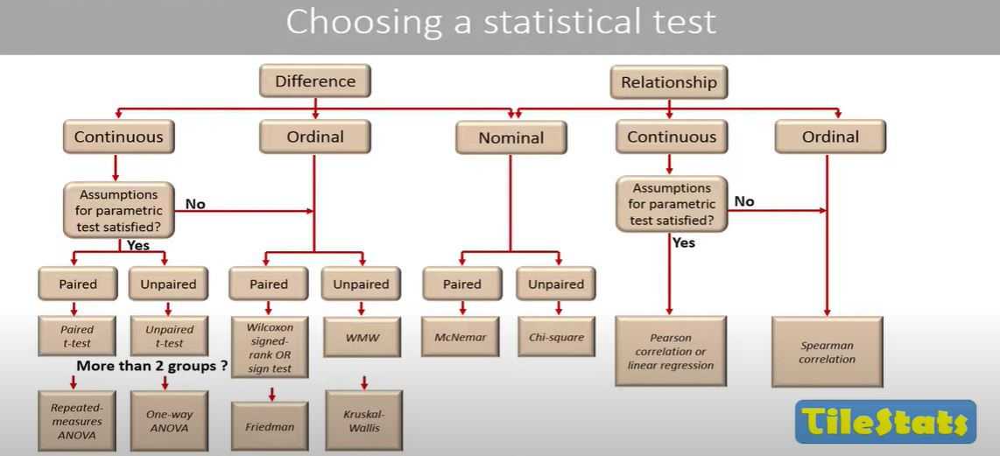

### **Continous Variables: Whether Parametric tests or Non-Parametric tests?**

Assumptions for Parametric Tests:
- **Independence of observations:** The separate observations (each variable entry) are unrelated to one another (for instance, repeating the same test on a single patient generates non-independent measurements, that is, repeated measurements).

- **Normality of data:** The data follows a normal distribution. This assumption is required only for quantitative data. (For more details, see also here)

- **Homogeneity of variance:** Each group being compared has a similar variance (i.e., the distribution, or “spread,” of scores around the mean). The “power” of the test to detect differences will be diminished if one group has significantly greater variation than the others.


####**Normality Tests- validate the Gaussian distribution of data.**

**Tests of equality of distributions:**

- **Shapiro-Wilk Test for normality**
- **Kolmogorov-Smirnov Test (KS-Test) of goodness of fit**
- **Q-Q plots**

##### **Shapiro-Wilk Test**
- Tests whether a data sample has a Gaussian distribution.
- **Assumption-**
  - Observations in each sample are independent and distributed identically.
- **Hypothesis**
  - H0: the sample has a Gaussian distribution.
  - H1: the sample does not have a Gaussian distribution.

In [38]:
# Perform Shapiro-Wilk test on each column in cont_all_df: continuous variables
for column in cont_all_df.columns[1:]:
    stat, p = stats.shapiro(cont_all_df[column])
    print(f"Shapiro-Wilk test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05:
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else:
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Shapiro-Wilk test for Max Heart Rate:
  Statistic: 0.9716181755065918
  p-value: 6.866362475191604e-44

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min Heart Rate:
  Statistic: 0.9904375672340393
  p-value: 4.8635451107712535e-28

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Mean Heart Rate:
  Statistic: 0.9883667230606079
  p-value: 1.270662467504408e-30

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max MAP:
  Statistic: 0.7134469747543335
  p-value: 0.0

The Max MAP does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min MAP:
  Statistic: 0.9794363975524902
  p-value: 8.243728163044217e-39

The Min MAP does

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


**Limitations.**
-  Sensitivity in large samples: The Shapiro-Wilk test is highly sensitive to even small deviations from normality in large samples.
-  This means that as the sample size increases, the test becomes more likely to reject the null hypothesis of normality, even if the deviations from normality are very small.

**Observation:**
- Performed Shapiro Wilk test conducted on the dataset without missing values. The result for all variables is "not normally distributed."

##### **Quantile-Quantile plot:**

- Plots data quantiles against theoretical quantiles.
- It also highlights the skewness of distribution. If data quantiles are higher than theoretical quantiles i.e., the Q-Q plot lies above the Y=X line, the data is positively and right-skewed. Else, otherwise.
- If there is deviation from Y=X line while considering normal as theoretical distribution, that means the variable is not-normal

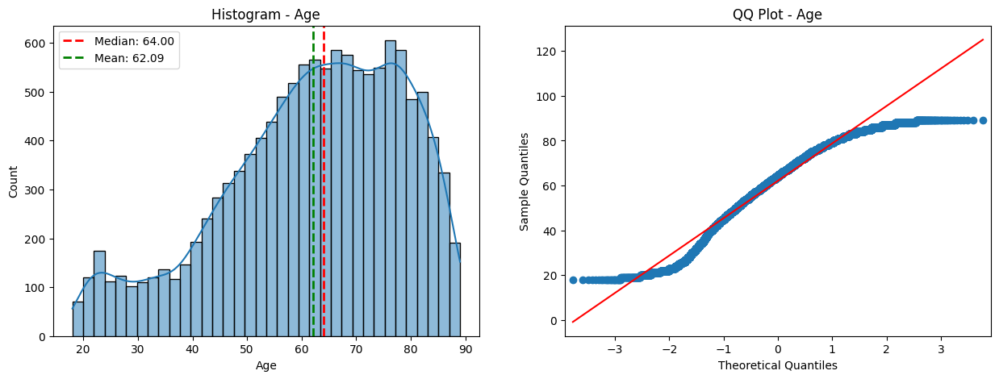

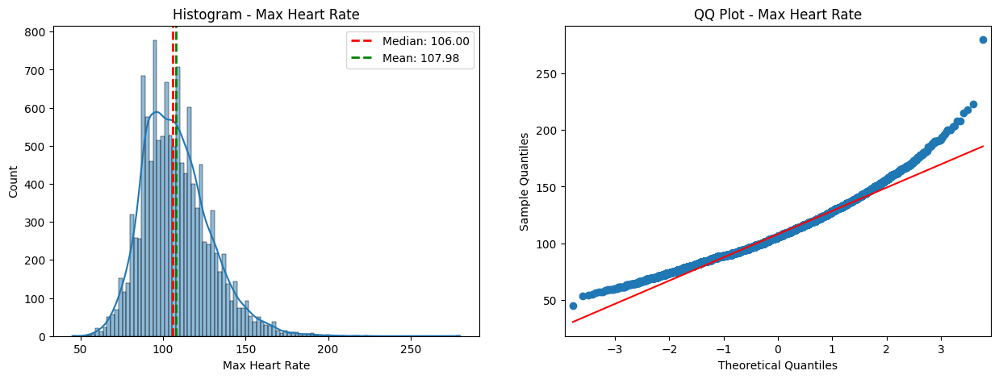

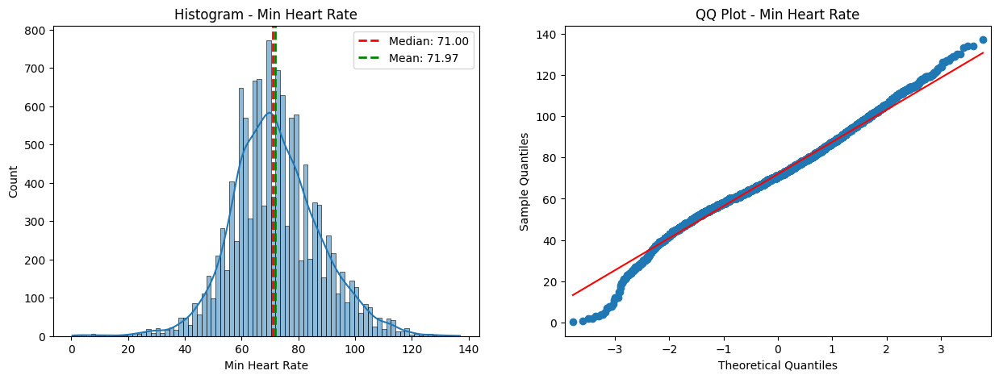

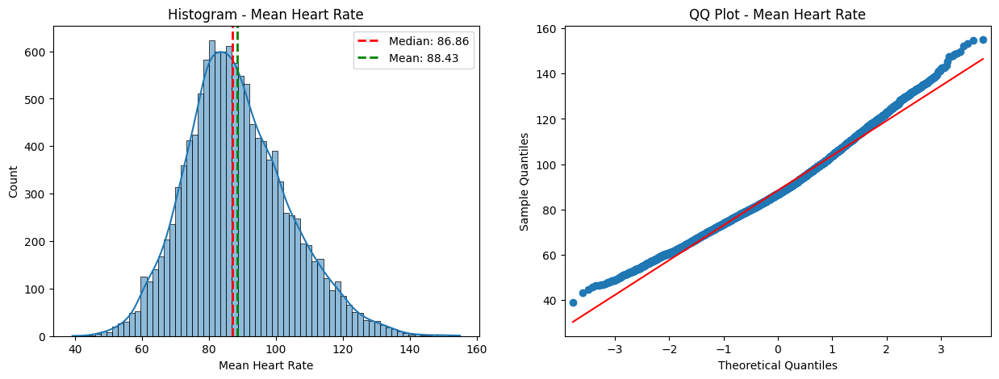

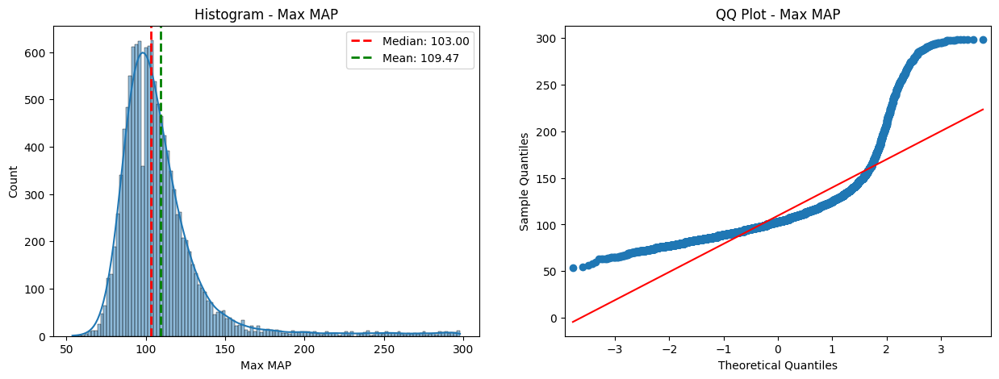

...

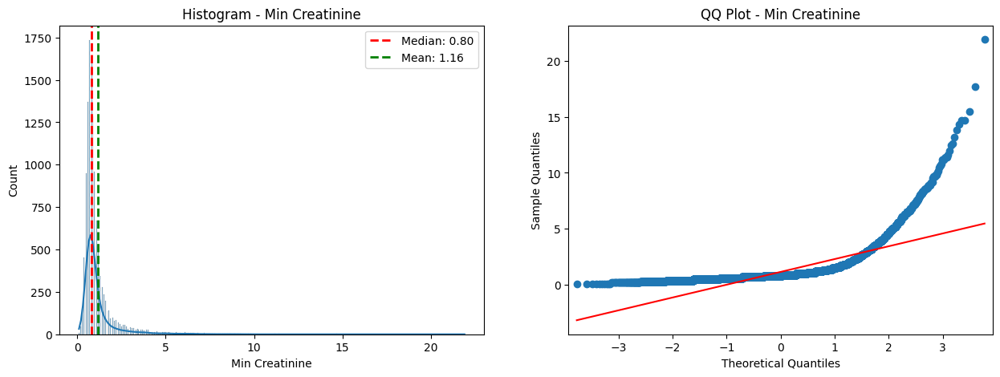

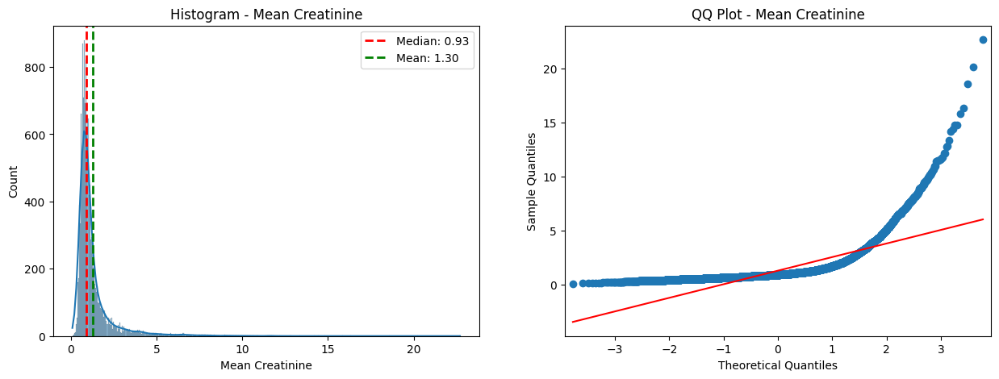

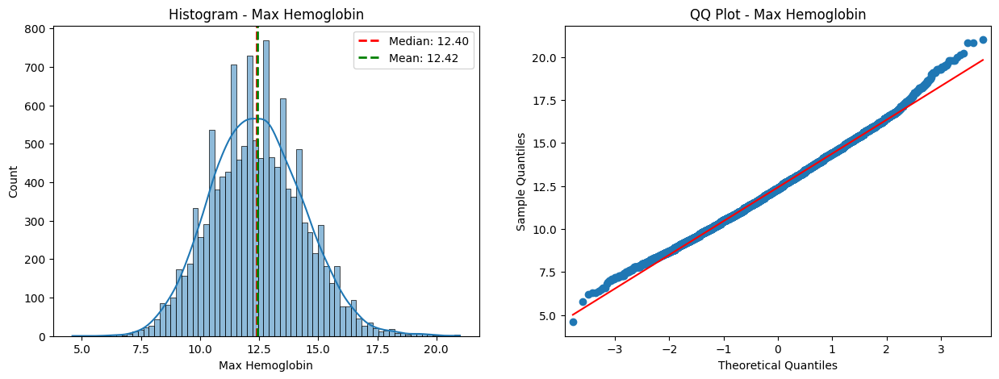

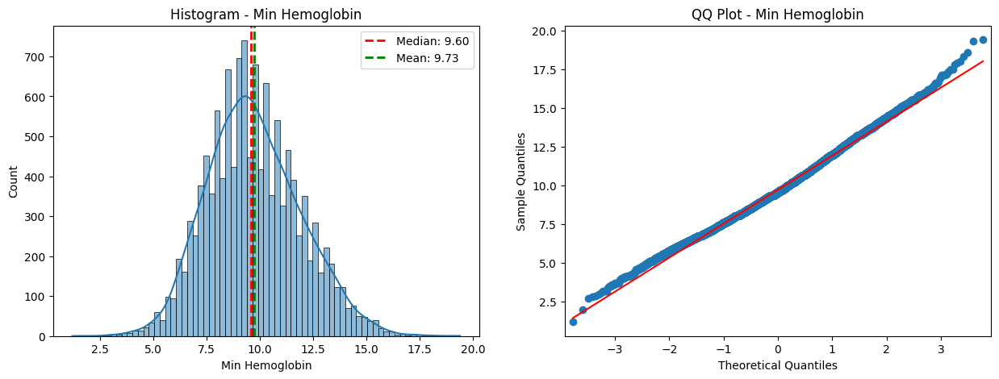

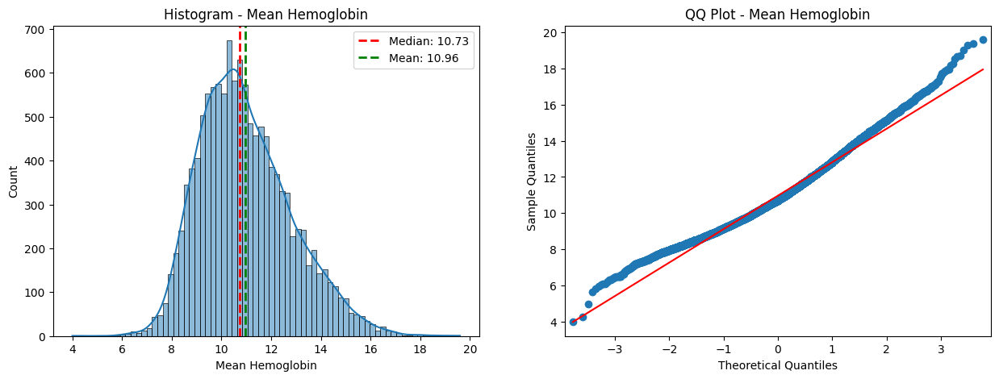

In [39]:
# histogram and QQ plot for each column
def plot_histogram_qqplot(data, column):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

    # Histogram with median and mean reference lines
    sns.histplot(data[column], kde=True, ax=axes[0])
    median_val = data[column].median()
    mean_val = data[column].mean()
    axes[0].axvline(median_val, color='r', linestyle='dashed', linewidth=2, label=f'Median: {median_val:.2f}')
    axes[0].axvline(mean_val, color='g', linestyle='dashed', linewidth=2, label=f'Mean: {mean_val:.2f}')
    axes[0].set_title(f'Histogram - {column}')
    axes[0].legend()

    # QQ Plot
    sm.qqplot(data[column], line='s', ax=axes[1])
    axes[1].set_title(f'QQ Plot - {column}')

    plt.show()

# Iterate through columns and create plots
for column in cont_all_df.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(cont_all_df, column)

**Observation:**


- Notice through visual inspection that the outliers are causing the shape to be skewed.

##### **Kolmogorov-Smirnov Test:**
- It can be used to check normality by comparing with normal distribution
- Max value of 1

In [40]:
# Perform Shapiro-Wilk test on each column in cont_all_df: continuous variables
for column in cont_all_df.columns[1:]:
    stat, p = kstest(cont_all_df[column], "norm")
    print(f"Kolmogorov-Smirnov Test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05: # null hypothesis rejected
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else: # null hypothesis failed to reject
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Kolmogorov-Smirnov Test for Max Heart Rate:
  Statistic: 1.0
  p-value: 0.0

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Min Heart Rate:
  Statistic: 0.9994879059861275
  p-value: 0.0

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Mean Heart Rate:
  Statistic: 1.0
  p-value: 0.0

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Max MAP:
  Statistic: 1.0
  p-value: 0.0

The Max MAP does not follow normal distribution
---------------------------------------------------------------------
Kolmogorov-Smirnov Test for Min MAP:
  Statistic: 1.0
  p-value: 0.0

The Min MAP does not follow normal distribution
---------------------------------------------------------------------
K

**Observation:**
- Performed Kolmogorov-Smirnov Test conducted on the dataset without missing values. The result for all variables is "not normally distributed."

From the above 3 tests, we can conclude that the data is not normally distributed. Lets transform the data and check if the skewness is improved.

### **Data Nomalization on Continuous variable**

#### **Log Transformation Method**

In [41]:
log_transformed_data = cont_all_df.copy()

for column in cont_all_df.columns:
    if column != 'Hospital Mortality':
        log_transformed_data[column] = np.log(cont_all_df[column] + 1)


print(log_transformed_data.head())

         Age  Max Heart Rate  Min Heart Rate  Mean Heart Rate   Max MAP  \
0   4.356709        5.129899        4.330733         4.725490  5.560682   
1   3.761200        4.718499        4.418841         4.537961  4.890349   
2   4.290459        4.663439        4.276666         4.463936  4.709530   
9   4.290459        4.007333        3.891820         3.955672  4.605170   
13  4.343805        4.867534        4.521789         4.668946  4.488636   

     Min MAP  Mean MAP  Max Systolic Pressure  Min Systolic Pressure  \
0   3.713572  4.339808               5.384495               4.174387   
1   4.219508  4.603669               5.384495               4.672829   
2   4.304065  4.490881               5.111988               4.595120   
9   4.158883  4.393499               4.990433               4.454347   
13  3.995137  4.304065               4.744932               4.219508   

    Mean Systolic Pressure  Max Diastolic Pressure  Min Diastolic Pressure  \
0                 4.644006            

##### **Visualization after log tranformation method**

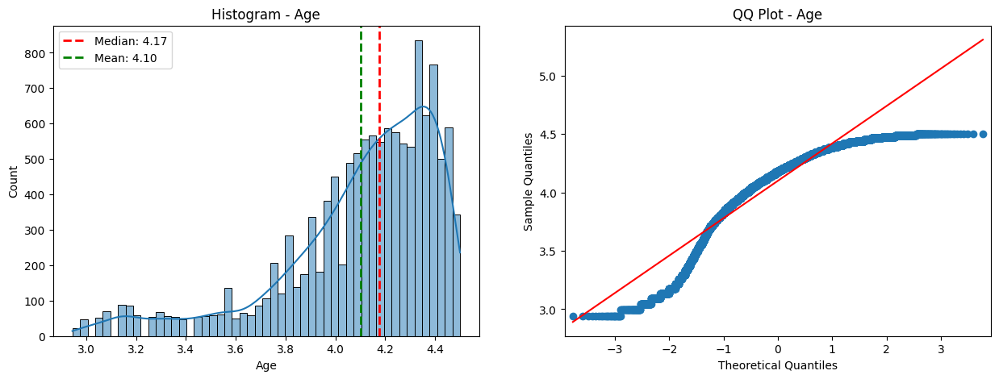

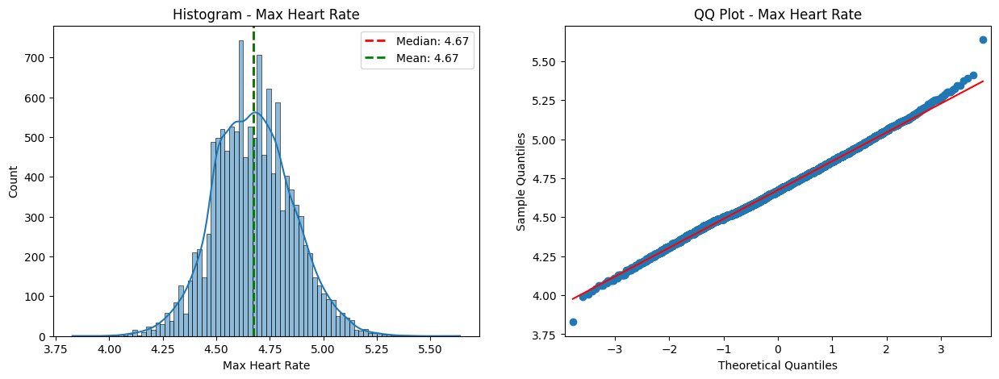

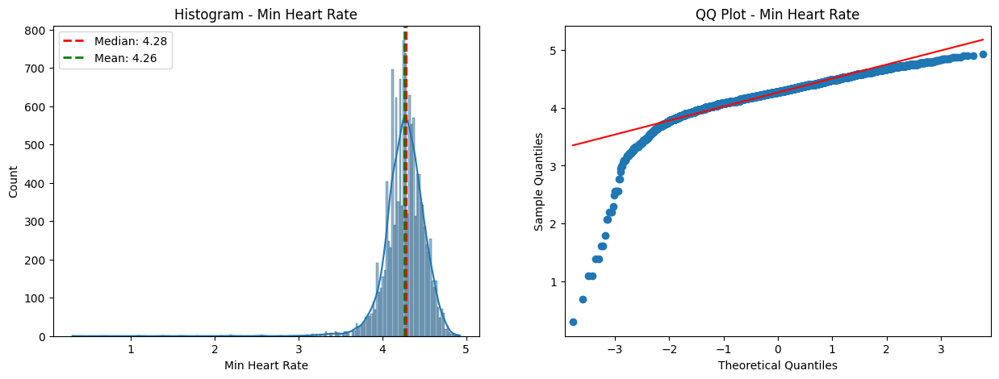

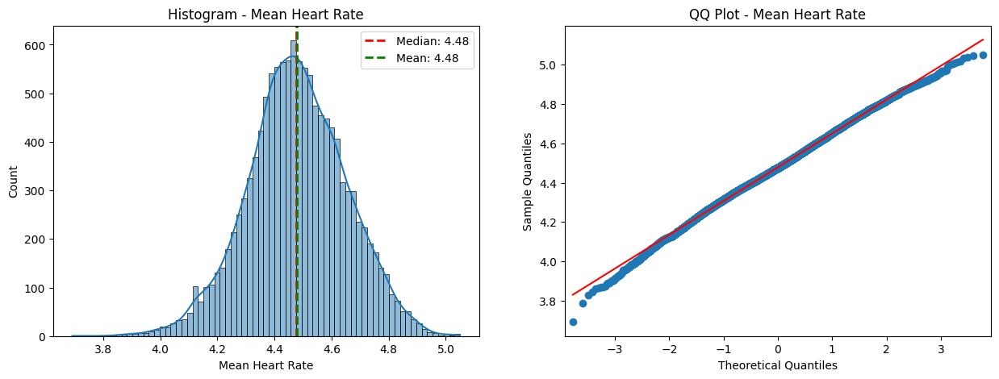

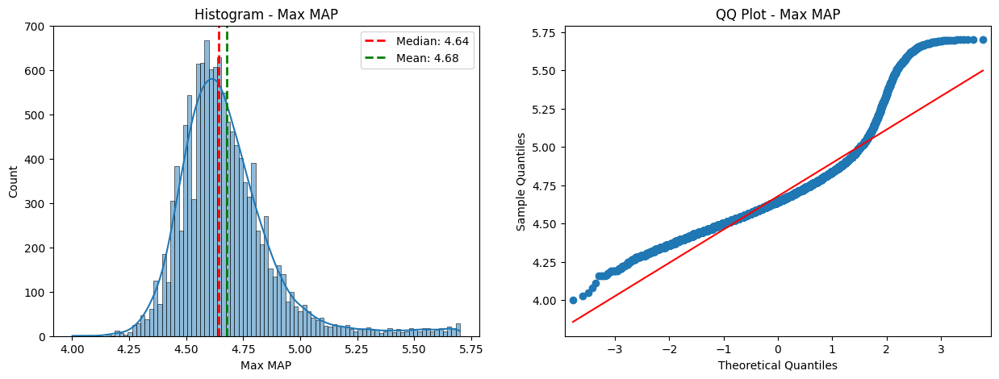

...

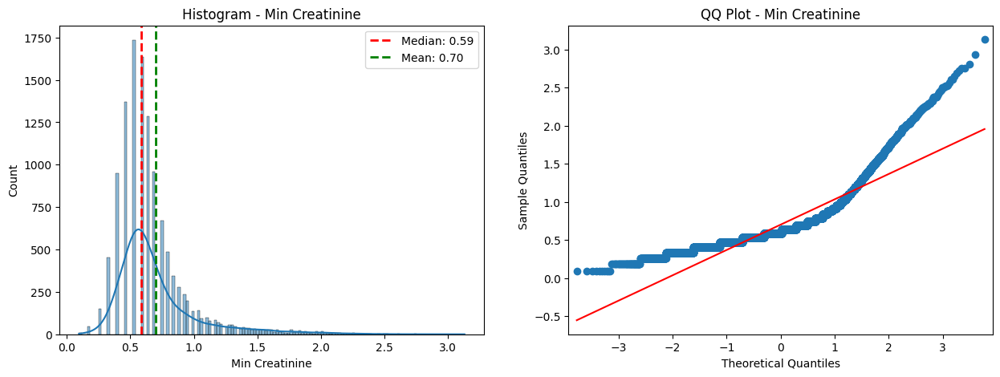

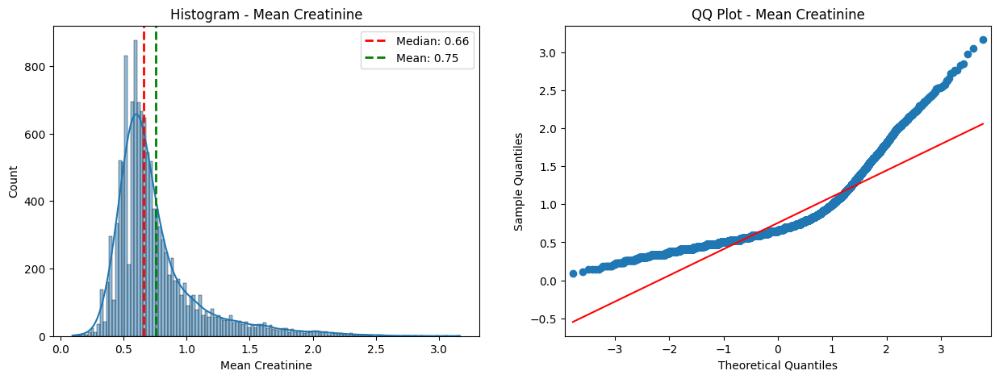

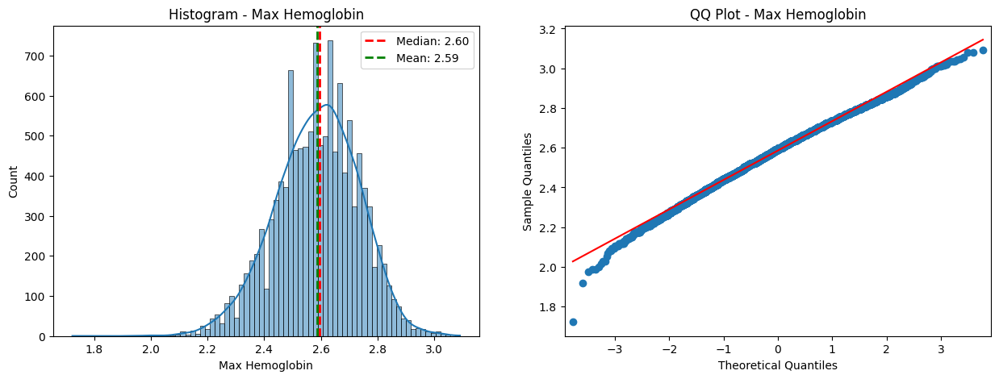

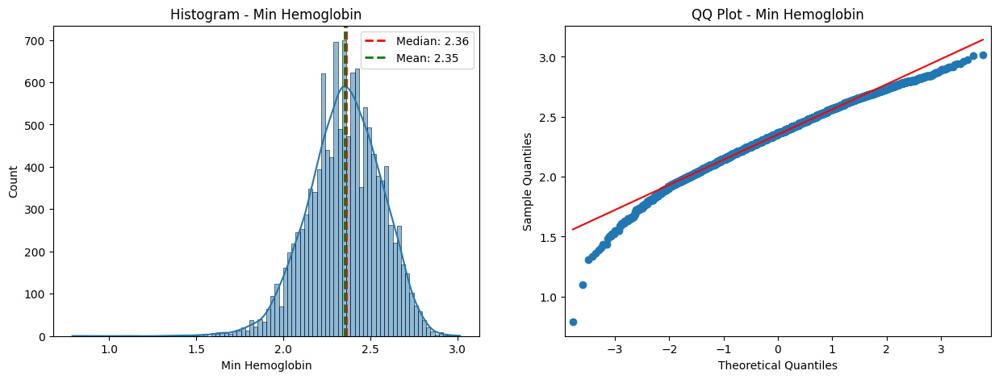

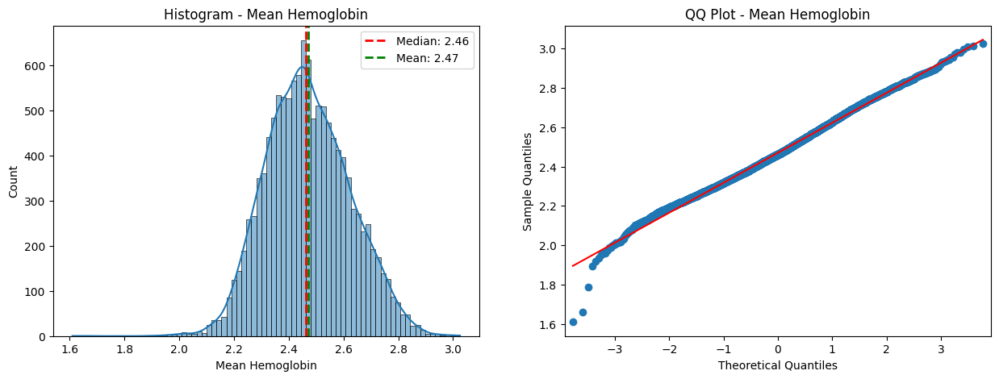

In [42]:
for column in log_transformed_data.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(log_transformed_data, column)

Data Distribution after normalization. There is an improvement in terms of normality for some variables but the rest are still skewed so we will be using Mann-WHitney test for most of the continuous variables.

##### **Check: Shapiro Wilk Test After Log Transformation**

In [44]:
# Perform Shapiro-Wilk test on each column in log_transformed_data
for column in log_transformed_data.columns[1:]:
    stat, p = stats.shapiro(log_transformed_data[column])
    print(f"Shapiro-Wilk test for {column}:")
    print(f"  Statistic: {stat}")
    print(f"  p-value: {p}")
    print("")

    if p < 0.05:
        print(f"The {column} does not follow normal distribution")
        print("---------------------------------------------------------------------")
    else:
        print(f"The {column}follows normal distribution")
        print("---------------------------------------------------------------------")

Shapiro-Wilk test for Max Heart Rate:
  Statistic: 0.9981642365455627
  p-value: 4.8528583929119407e-11

The Max Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min Heart Rate:
  Statistic: 0.8807404041290283
  p-value: 0.0

The Min Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Mean Heart Rate:
  Statistic: 0.9987273216247559
  p-value: 2.0667322075951233e-08

The Mean Heart Rate does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Max MAP:
  Statistic: 0.8827296495437622
  p-value: 0.0

The Max MAP does not follow normal distribution
---------------------------------------------------------------------
Shapiro-Wilk test for Min MAP:
  Statistic: 0.8855717778205872
  p-value: 0.0

The Min MAP does not follow normal distribution
---

**Observations:**

- Applied Shapiro Wilk test on the normalized data using log transformation. The result still shows that the data are not normally distruted however visual inspection tells us otherwise

#### **BoxCox Method**

In [45]:
# Apply Box-Cox transformation to all numeric columns
box_cox_data = cont_all_df.copy()  # Create a copy of the original DataFrame

# Define a function to apply Box-Cox transformation
def apply_boxcox(x):
    # Skip non-numeric columns
    if not pd.api.types.is_numeric_dtype(x):
        return x

    # Check if the column contains any zero or negative values
    if (x <= 0).any():
        # Add a small constant to ensure all values are strictly positive
        x += np.abs(x.min()) + 1e-6

    # Apply Box-Cox transformation
    transformed_data, _ = boxcox(x)
    return transformed_data

# Apply the function to all columns using applymap
box_cox_df = box_cox_data.applymap(apply_boxcox)

# Now transformed_df contains Box-Cox transformed values for all numeric columns

##### **Visualization After BoxCox Method**

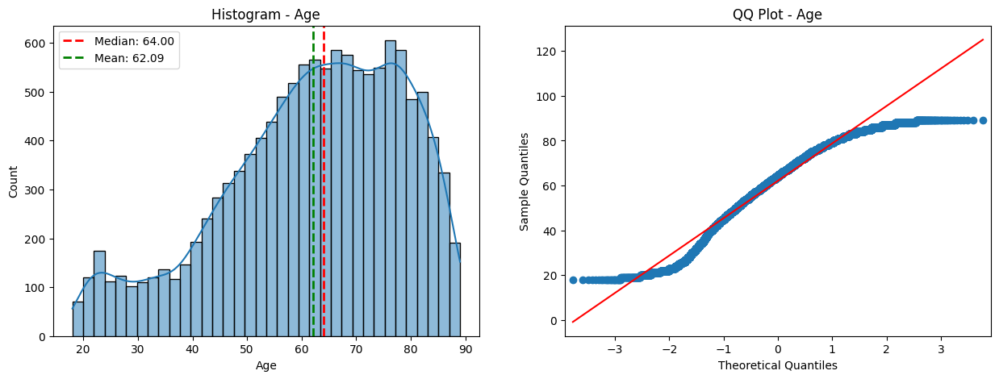

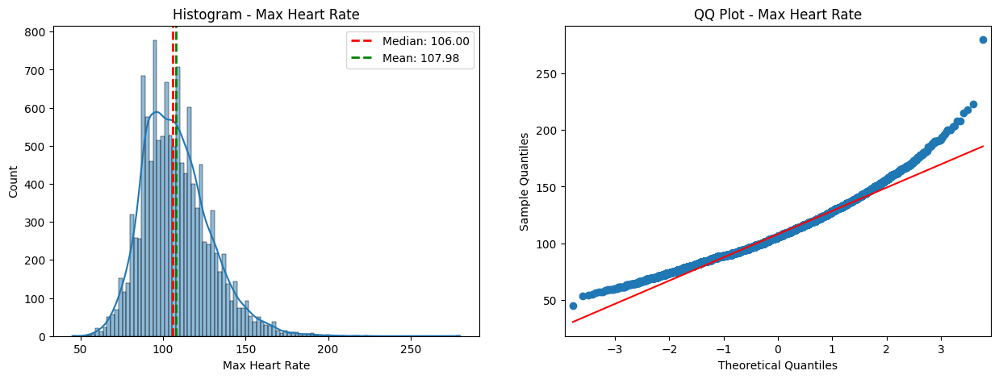

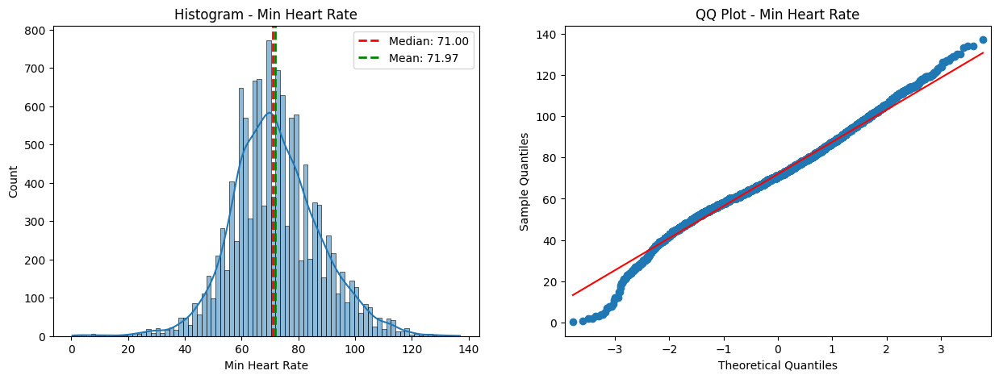

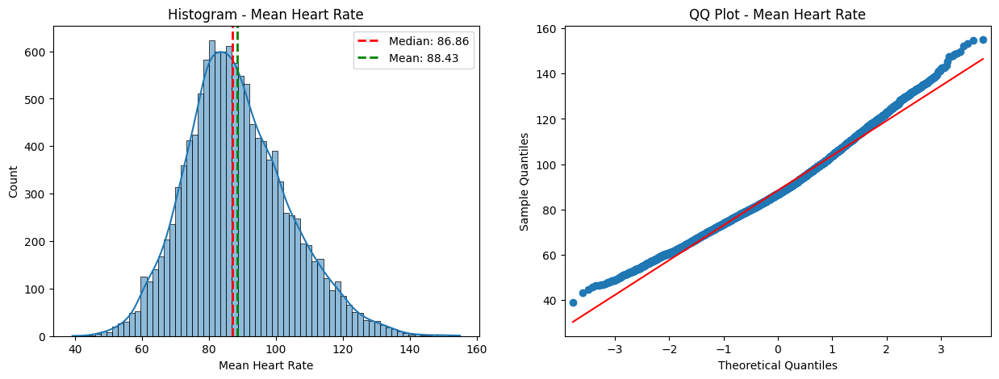

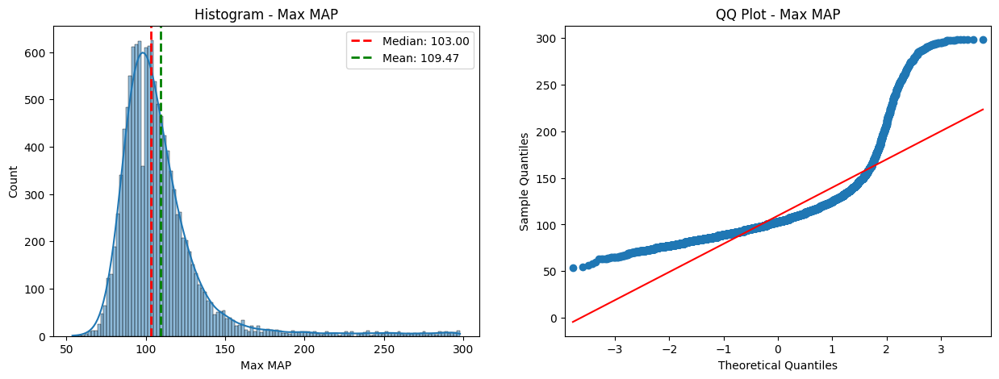

...

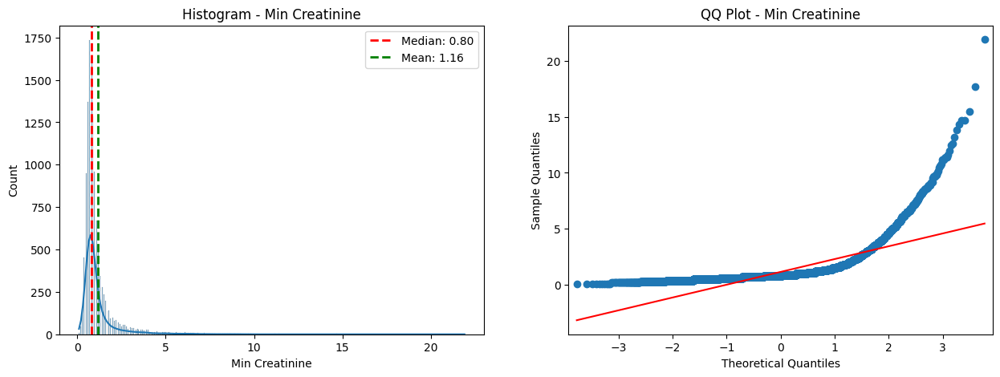

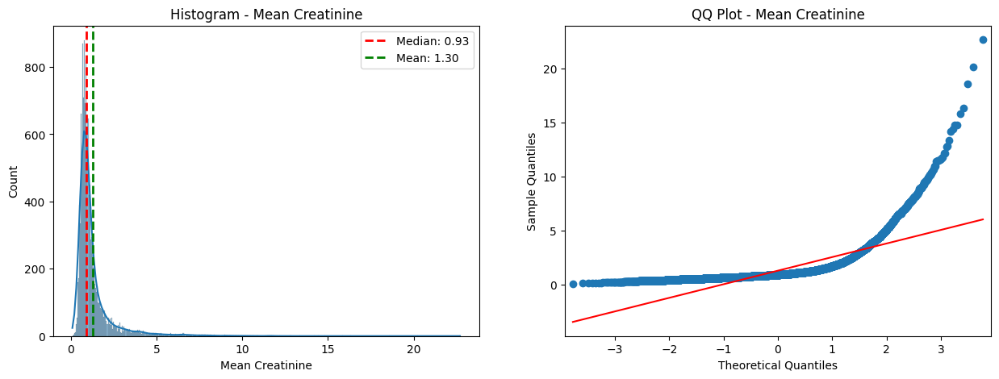

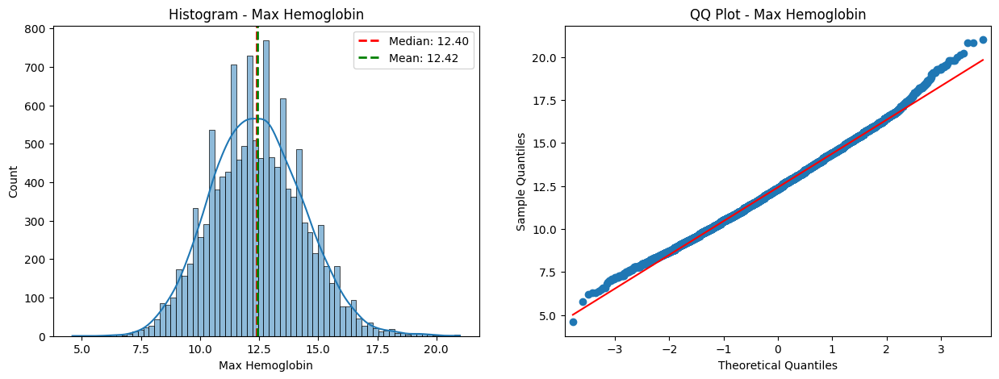

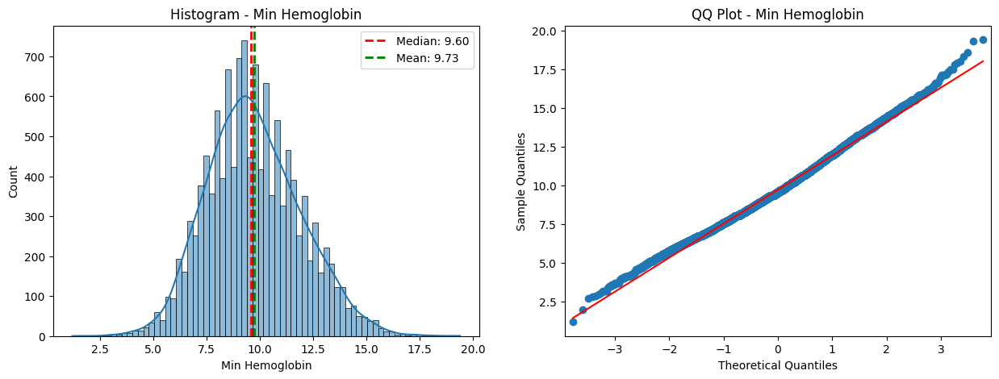

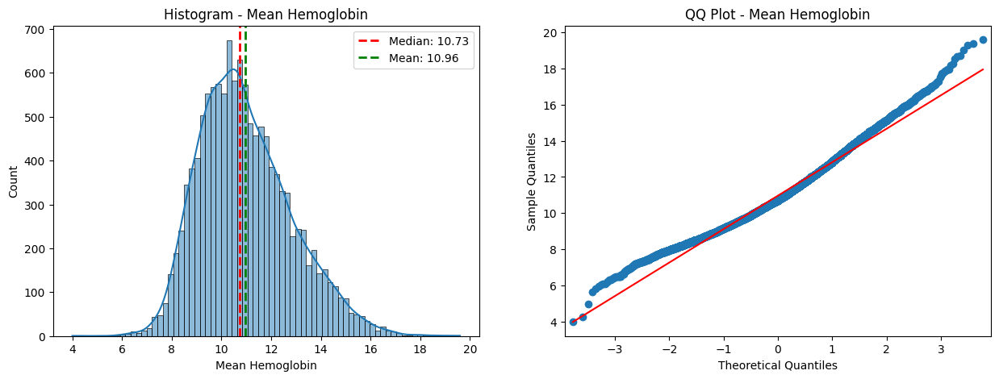

In [46]:
for column in box_cox_df.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(box_cox_df, column)

#### **Min-Max Method**

In [48]:
scaler = MinMaxScaler()

# Apply Min-Max scaling to all columns
scaled_data = scaler.fit_transform(cont_all_df)

# Convert the scaled data array back to a DataFrame
scaled_df = pd.DataFrame(scaled_data, columns=cont_all_df.columns)

##### **Visualization After Min-Max Method**

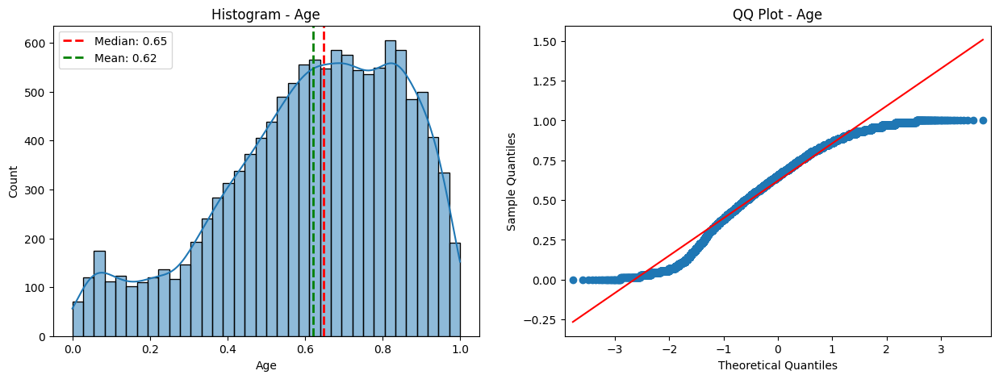

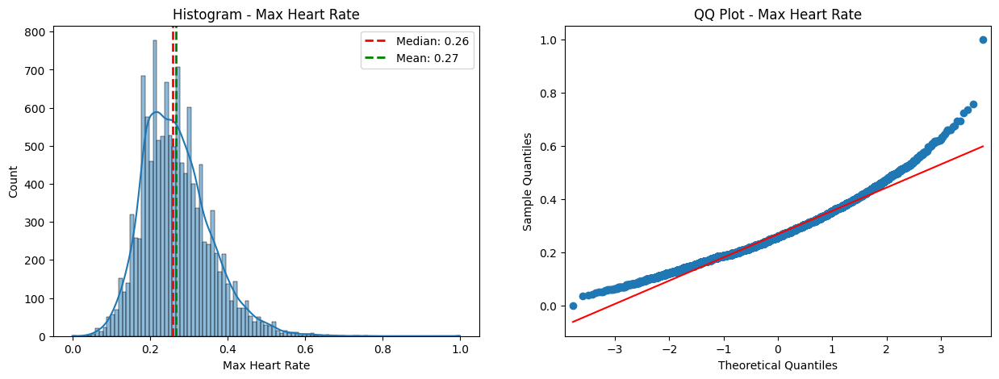

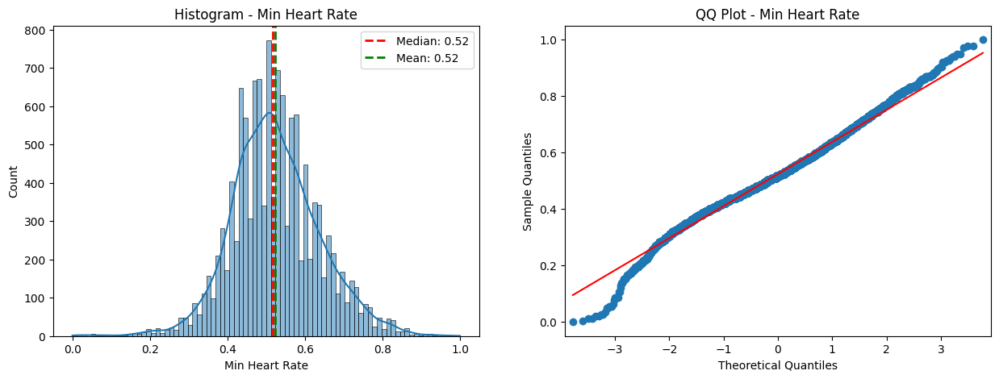

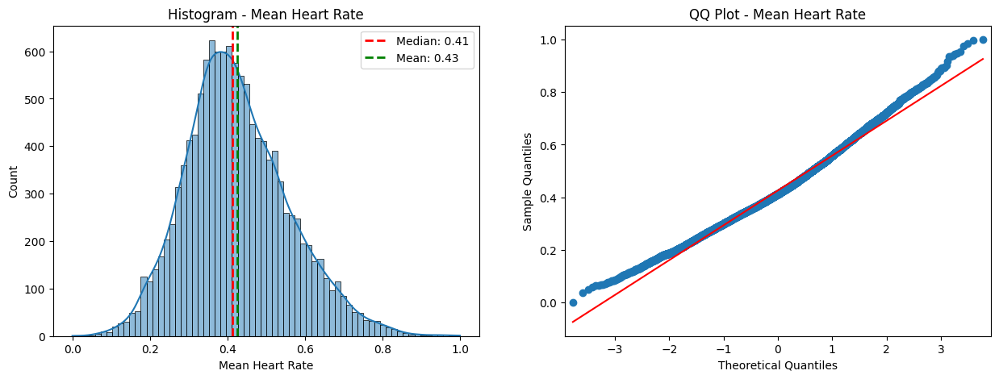

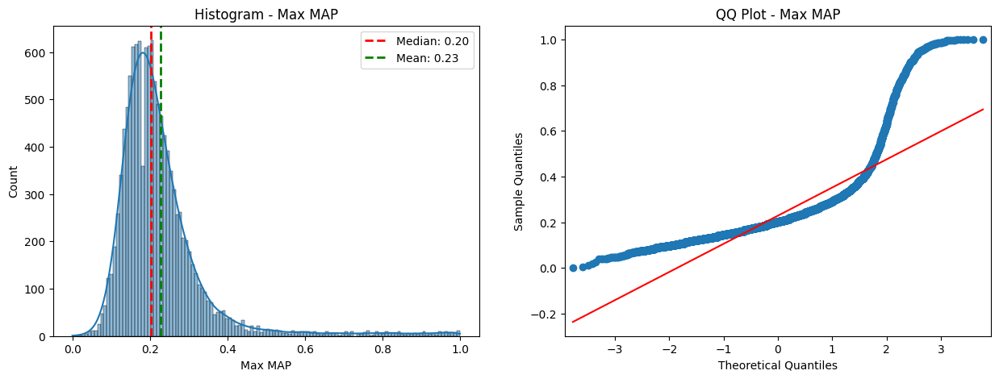

...

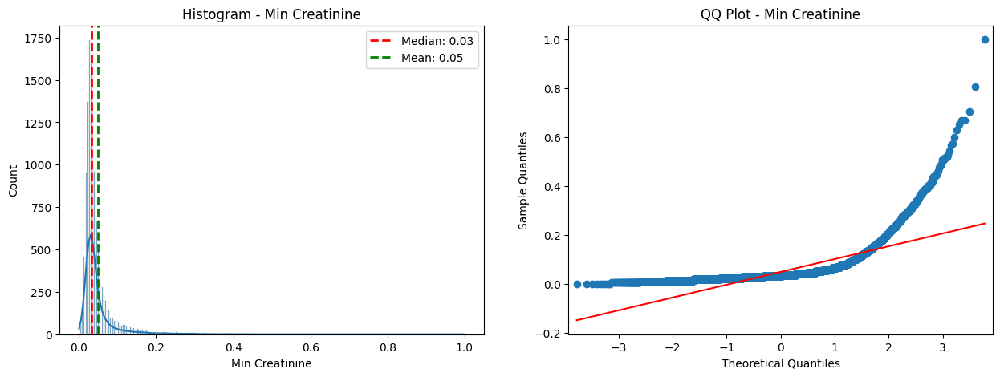

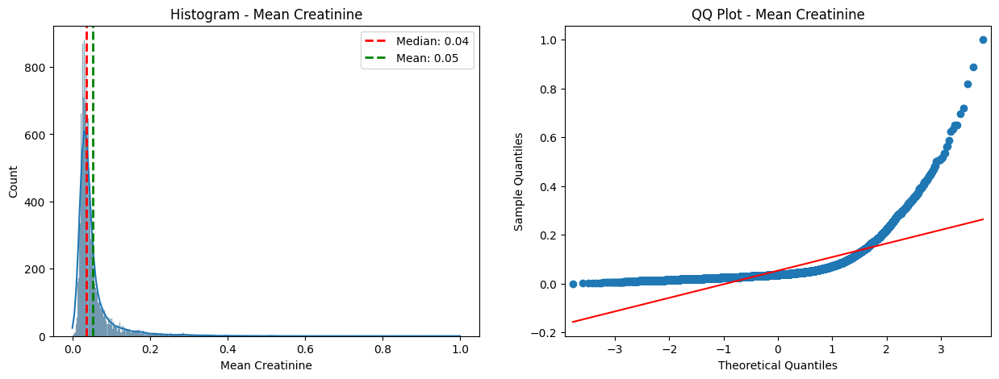

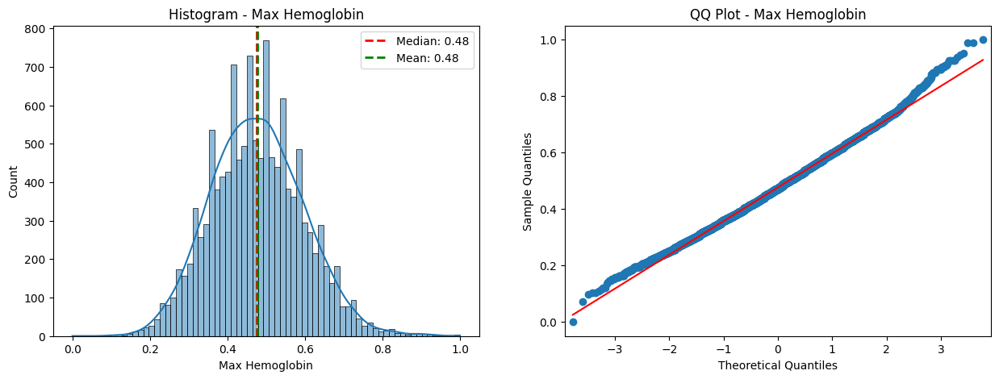

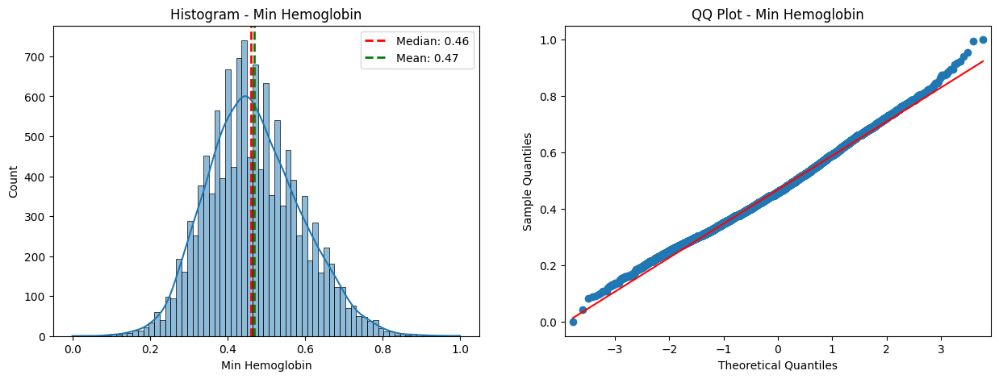

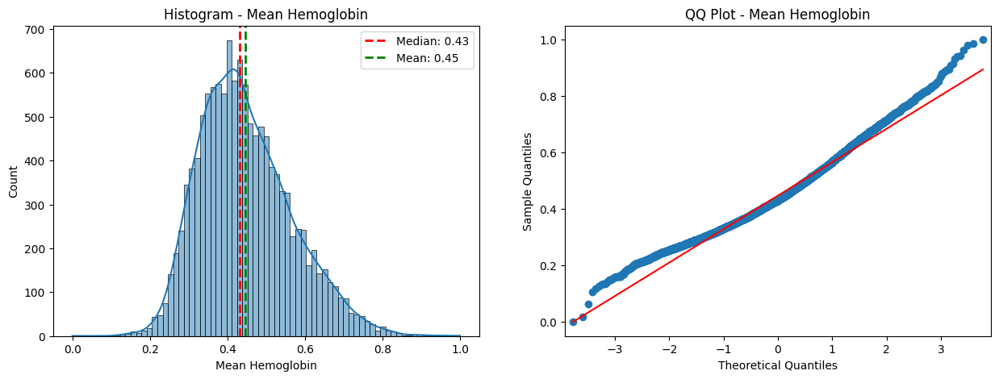

In [49]:
# Iterate through columns and create plots
for column in scaled_df.columns:
    if column != 'Hospital Mortality':  # Skip the target column
        plot_histogram_qqplot(scaled_df, column)

#### **L2 Normalization**

In [50]:
X = cont_all_df.to_numpy()
norms = np.linalg.norm(X, axis=0)
normalized_data = X / norms
normalized_df = pd.DataFrame(normalized_data, columns=cont_all_df.columns)

In [51]:
normalized_df.head()

,Age,Max Heart Rate,Min Heart Rate,Mean Heart Rate,Max MAP,Min MAP,Mean MAP,Max Systolic Pressure,Min Systolic Pressure,Mean Systolic Pressure,Max Diastolic Pressure,Min Diastolic Pressure,Mean Diastolic Pressure,Max Temperature,Min Temperature,Mean Temperature,Max Lactate,Min Lactate,Mean Lactate,Max pH,Min pH,Mean pH,Max Glucose,Min Glucose,Mean Glucose,Max WBC,Min WBC,Mean WBC,Max BUN,Min BUN,Mean BUN,Max Creatinine,Min Creatinine,Mean Creatinine,Max Hemoglobin,Min Hemoglobin,Mean Hemoglobin
0,0.010717,0.013675,0.009115,0.011144,0.020411,0.006102,0.008584,0.012558,0.006451,0.007799,0.007731,0.005592,0.008140,0.008910,0.008987,0.008956,0.018049,0.008220,0.013812,0.009139,0.008911,0.008942,0.012649,0.007068,0.013003,0.011270,0.007406,0.009490,0.014316,0.013204,0.013219,0.014234,0.013160,0.013121,0.009110,0.006999,0.008081
1,0.005846,0.009036,0.009965,0.009222,0.010402,0.010220,0.011210,0.012558,0.010684,0.012072,0.011178,0.010584,0.011617,0.008979,0.008813,0.008967,0.005538,0.007437,0.006608,0.008946,0.009071,0.009003,0.007530,0.010019,0.008889,0.006328,0.004916,0.005828,0.004592,0.005153,0.004874,0.006227,0.006580,0.006437,0.010960,0.011576,0.011349
2,0.010021,0.008547,0.008629,0.008557,0.008669,0.011135,0.010003,0.009549,0.009878,0.009713,0.008253,0.010984,0.009479,0.008926,0.008813,0.008863,0.030971,0.007828,0.027312,0.008850,0.008617,0.008748,0.008080,0.006835,0.009713,0.003880,0.005112,0.004453,0.010535,0.009017,0.009896,0.007562,0.007128,0.007427,0.009466,0.006999,0.008234
3,0.010021,0.004396,0.005833,0.005107,0.007802,0.009610,0.009064,0.008449,0.008567,0.008647,0.007731,0.009586,0.008754,0.008781,0.009144,0.008945,0.003077,0.005480,0.004112,0.008995,0.009157,0.009076,0.004907,0.007844,0.006302,0.003187,0.004522,0.003794,0.003512,0.003542,0.003545,0.004003,0.003838,0.003961,0.007544,0.009512,0.008532
4,0.010578,0.010501,0.011059,0.010526,0.006935,0.008136,0.008279,0.006597,0.006753,0.007143,0.007940,0.007589,0.009108,0.008979,0.008592,0.008840,0.005743,0.010959,0.007941,0.008814,0.008985,0.008893,0.005796,0.007301,0.006678,0.008406,0.011929,0.010006,0.014857,0.013526,0.014326,0.011565,0.009870,0.010893,0.008896,0.011217,0.010061


#### **Visualization after L2 Normalization**

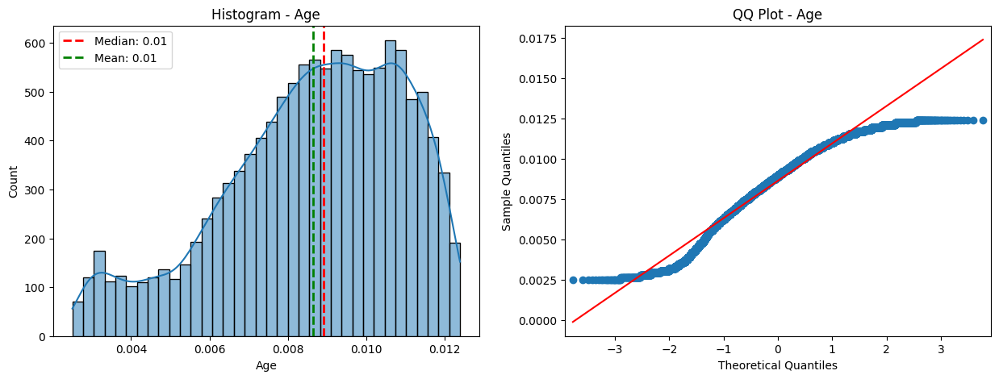

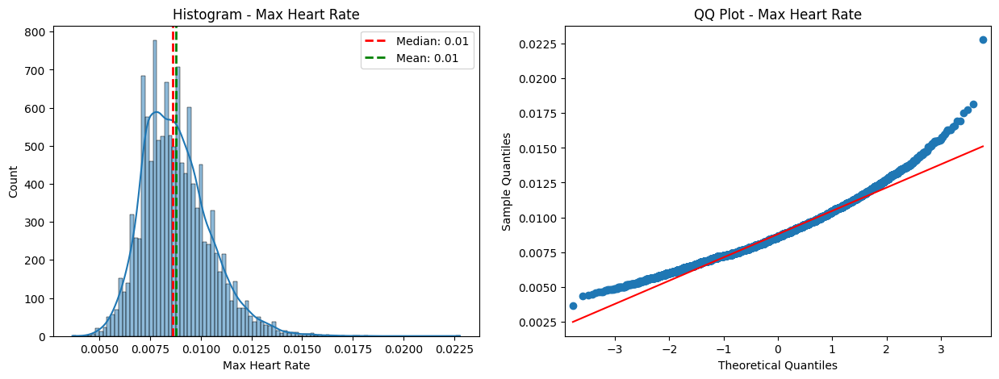

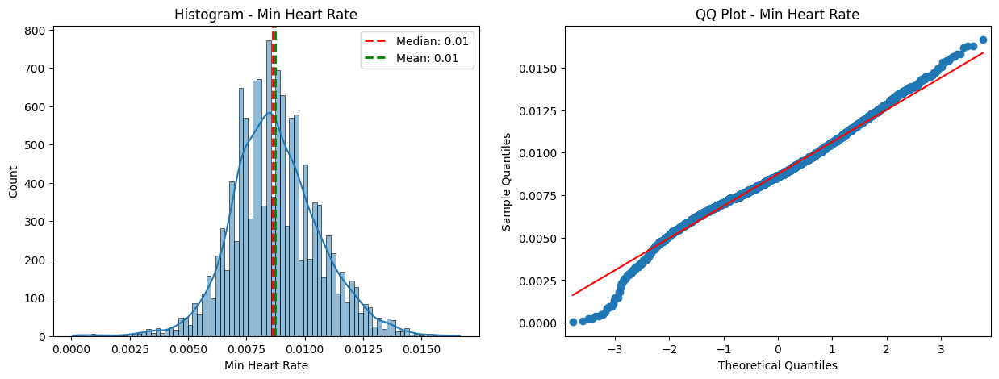

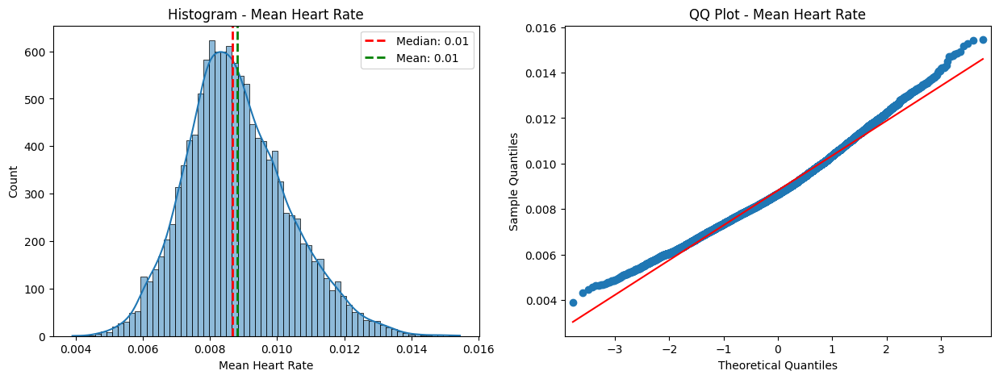

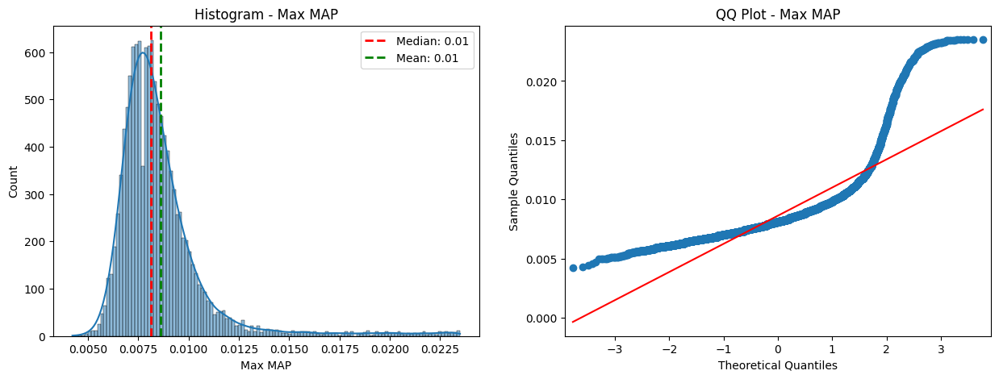

...

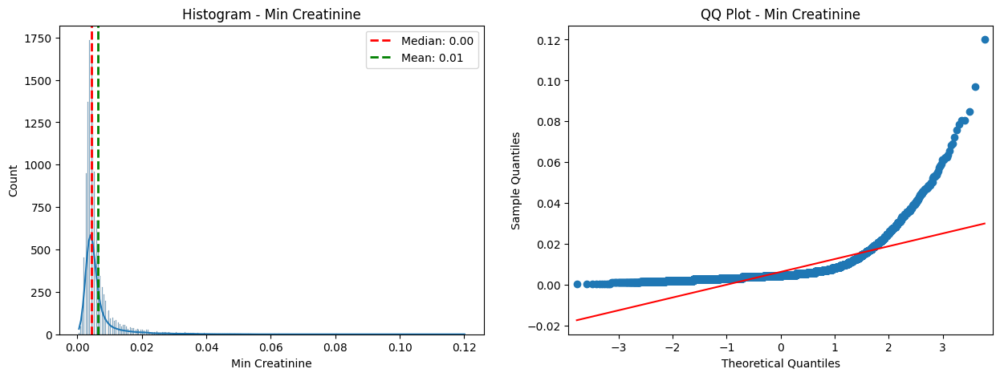

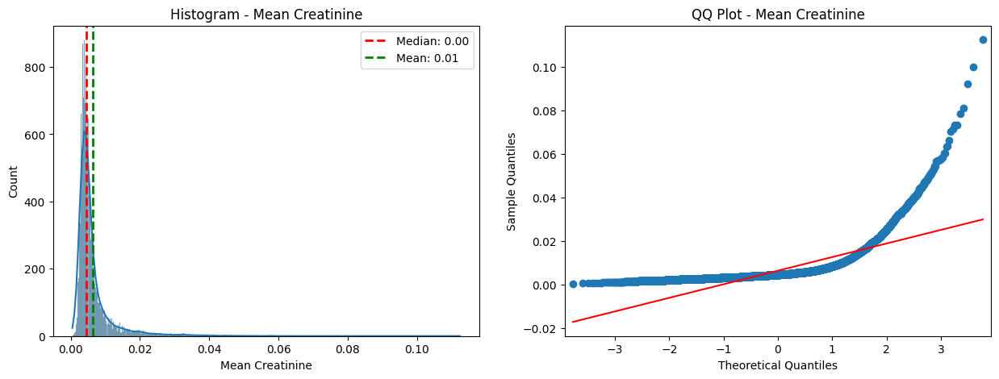

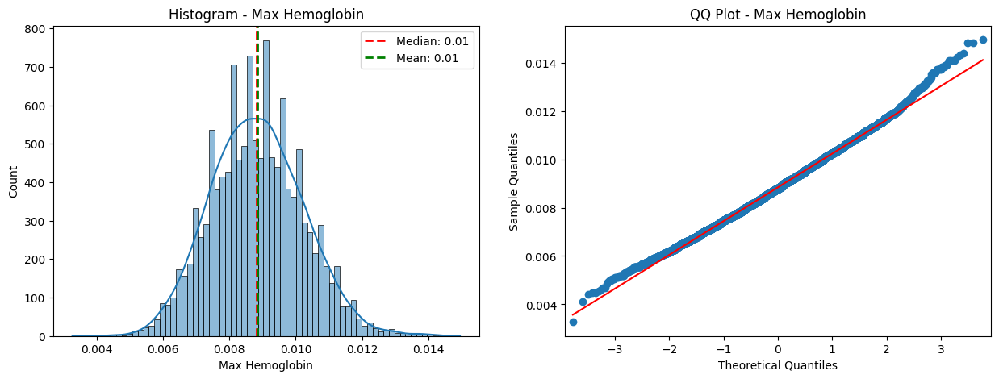

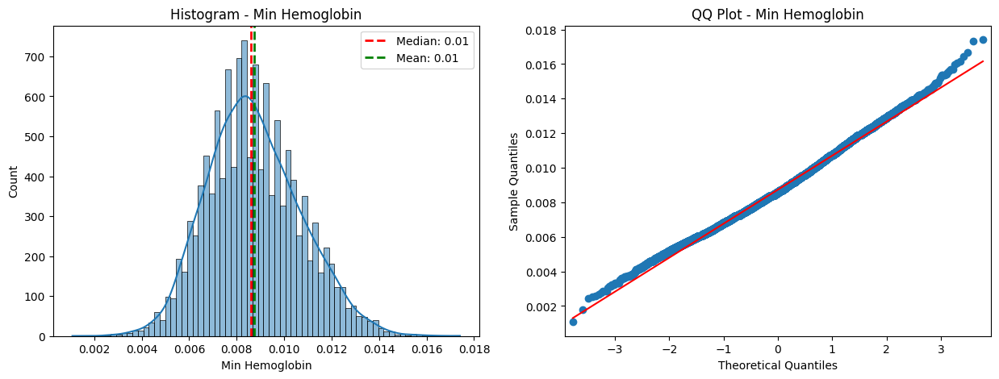

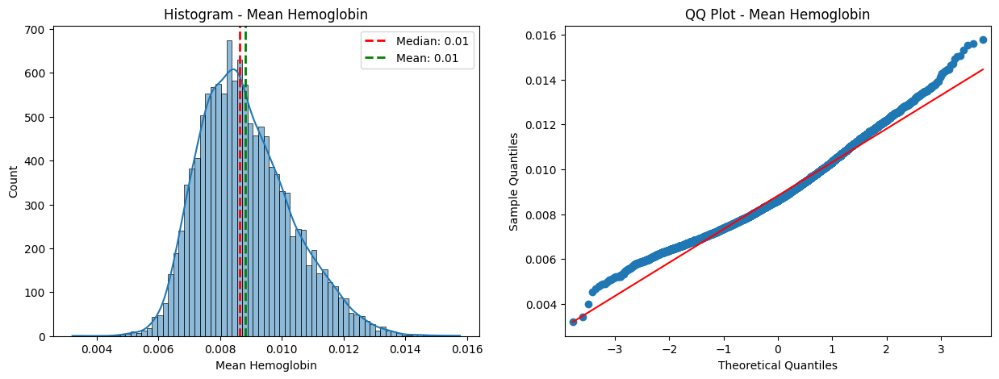

In [52]:
for column in normalized_df.columns:
    if column != 'Hospital Mortality':
        plot_histogram_qqplot(normalized_df, column)

**Observations:**
- Out of all the methods above, we will choose log transformation as we can observe that few variables have attained a normal distribution after normalization using log transformation